# Mounting Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing Libraries

In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

# Data Preprocessing

## Training Image preprocessing

In [3]:
training_set = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/Mini Project/train',
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(64,64),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)

Found 3115 files belonging to 36 classes.


In [4]:
training_set

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 36), dtype=tf.float32, name=None))>

In [5]:
train_labels = training_set.class_names
train_labels

['apple',
 'banana',
 'beetroot',
 'bell pepper',
 'cabbage',
 'capsicum',
 'carrot',
 'cauliflower',
 'chilli pepper',
 'corn',
 'cucumber',
 'eggplant',
 'garlic',
 'ginger',
 'grapes',
 'jalepeno',
 'kiwi',
 'lemon',
 'lettuce',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'peas',
 'pineapple',
 'pomegranate',
 'potato',
 'raddish',
 'soy beans',
 'spinach',
 'sweetcorn',
 'sweetpotato',
 'tomato',
 'turnip',
 'watermelon']

In [6]:
# Extracting all fruit and vegetable names from their file paths
train_data = list()
for i in training_set.file_paths:
  train_data.append(i.split('/')[-2])

# Creating a dictionary with keys as fruit or vegetable name and values as their count
train_value_counts = dict()
for i in train_data:
  if i not in train_value_counts:
    train_value_counts[i] = 1
  else:
    train_value_counts[i] += 1

# Sorting the dictionary in ascending order of it's keys
sorted_train_counts = dict(sorted(train_value_counts.items()))
sorted_train_counts

{'apple': 68,
 'banana': 75,
 'beetroot': 88,
 'bell pepper': 90,
 'cabbage': 92,
 'capsicum': 89,
 'carrot': 82,
 'cauliflower': 79,
 'chilli pepper': 87,
 'corn': 87,
 'cucumber': 94,
 'eggplant': 84,
 'garlic': 92,
 'ginger': 68,
 'grapes': 100,
 'jalepeno': 88,
 'kiwi': 88,
 'lemon': 82,
 'lettuce': 97,
 'mango': 86,
 'onion': 94,
 'orange': 69,
 'paprika': 83,
 'pear': 89,
 'peas': 100,
 'pineapple': 99,
 'pomegranate': 79,
 'potato': 77,
 'raddish': 81,
 'soy beans': 97,
 'spinach': 97,
 'sweetcorn': 91,
 'sweetpotato': 69,
 'tomato': 92,
 'turnip': 98,
 'watermelon': 84}

## Bar plot for number of Training Images of each Fruit or Vegetable

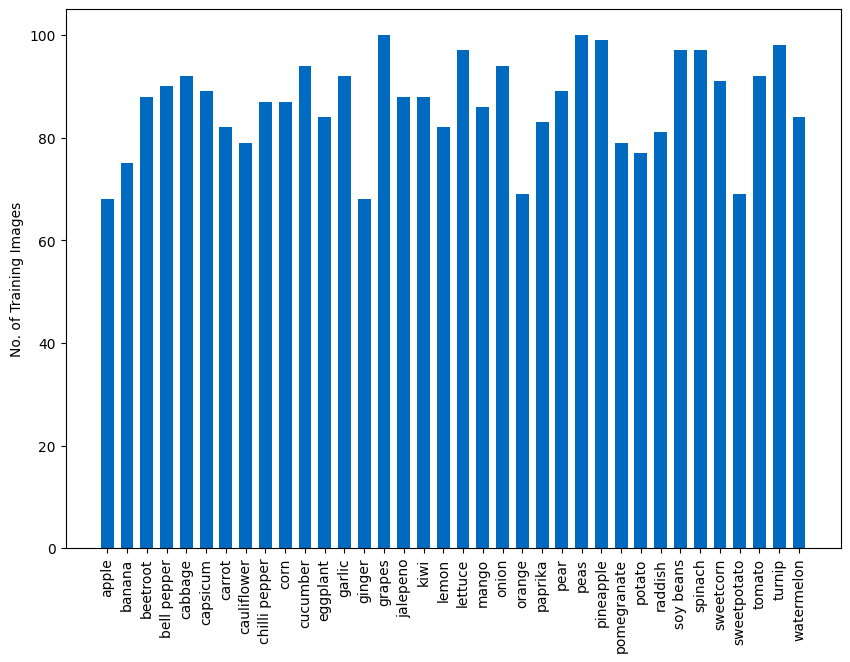

In [7]:
plt.figure(figsize=(10,7))

plt.bar(train_labels, sorted_train_counts.values(), width=0.65, color='#0069c0')
plt.ylabel("No. of Training Images")
plt.xticks(rotation="vertical")
plt.show()

## Validation Image Preprocessing

In [8]:
validation_set = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/Mini Project/validation',
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(64, 64),
    shuffle=True,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)

Found 351 files belonging to 36 classes.


In [9]:
validation_labels = validation_set.class_names
validation_labels

['apple',
 'banana',
 'beetroot',
 'bell pepper',
 'cabbage',
 'capsicum',
 'carrot',
 'cauliflower',
 'chilli pepper',
 'corn',
 'cucumber',
 'eggplant',
 'garlic',
 'ginger',
 'grapes',
 'jalepeno',
 'kiwi',
 'lemon',
 'lettuce',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'peas',
 'pineapple',
 'pomegranate',
 'potato',
 'raddish',
 'soy beans',
 'spinach',
 'sweetcorn',
 'sweetpotato',
 'tomato',
 'turnip',
 'watermelon']

# Building CNN Model

In [10]:
cnn = tf.keras.models.Sequential()

## Adding Data Augmentation

## Adding Convolution Layers in Model

In [11]:
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',input_shape=[64,64,3]))
cnn.add(tf.keras.layers.Conv2D(filters=32,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

cnn.add(tf.keras.layers.Dropout(0.25))

cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
cnn.add(tf.keras.layers.Conv2D(filters=64,kernel_size=3,activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2,strides=2))

cnn.add(tf.keras.layers.Dropout(0.25))

## Adding Dense layers in Model

In [12]:
cnn.add(tf.keras.layers.Flatten())

cnn.add(tf.keras.layers.Dense(units=512,activation='relu'))
cnn.add(tf.keras.layers.Dense(units=256,activation='relu'))
# To avoid overfitting
cnn.add(tf.keras.layers.Dropout(0.5))
# Output Layer
cnn.add(tf.keras.layers.Dense(units=36,activation='softmax'))

## Adding TensorBoard Callback

In [13]:
tb_callback = tf.keras.callbacks.TensorBoard(log_dir="/content/drive/MyDrive/Mini Project/logs/", histogram_freq = 1)

## Adding Early Stopping Callback

In [14]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Compiling and Training Phase

In [15]:
cnn.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [16]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 62, 62, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 31, 31, 32)        0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 31, 31, 32)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 31, 31, 64)        18496     
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 64)        36928     
                                                        

In [18]:
training_history = cnn.fit(x=training_set, validation_data=validation_set, epochs=32, callbacks=[tb_callback, early_stopping])

Epoch 1/32
98/98 [==============================] - 78s 738ms/step - loss: 3.5447 - accuracy: 0.0430 - val_loss: 3.5620 - val_accuracy: 0.0399
Epoch 2/32
98/98 [==============================] - 76s 719ms/step - loss: 3.5272 - accuracy: 0.0498 - val_loss: 3.4423 - val_accuracy: 0.0912
Epoch 3/32
98/98 [==============================] - 76s 729ms/step - loss: 3.4787 - accuracy: 0.0690 - val_loss: 3.3375 - val_accuracy: 0.1282
Epoch 4/32
98/98 [==============================] - 77s 728ms/step - loss: 3.3838 - accuracy: 0.0825 - val_loss: 3.2861 - val_accuracy: 0.1453
Epoch 5/32
98/98 [==============================] - 76s 727ms/step - loss: 3.3499 - accuracy: 0.0902 - val_loss: 3.1314 - val_accuracy: 0.1738
Epoch 6/32
98/98 [==============================] - 76s 722ms/step - loss: 3.2576 - accuracy: 0.1165 - val_loss: 2.9513 - val_accuracy: 0.2479
Epoch 7/32
98/98 [==============================] - 75s 725ms/step - loss: 3.1261 - accuracy: 0.1522 - val_loss: 2.9097 - val_accuracy: 0.2536

## Displaying the TensorBoard logs

In [19]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Mini\ Project/logs

<IPython.core.display.Javascript object>

## Evaluating the Model

In [20]:
# Training set Accuracy
train_loss, train_acc = cnn.evaluate(training_set)
print('Training accuracy:', train_acc)

98/98 [==============================] - 66s 617ms/step - loss: 0.2207 - accuracy: 0.9396
Training accuracy: 0.9396468997001648


In [21]:
# Validation set Accuracy
val_loss, val_acc = cnn.evaluate(validation_set)
print('Validation accuracy:', val_acc)

11/11 [==============================] - 10s 114ms/step - loss: 0.4169 - accuracy: 0.9259
Validation accuracy: 0.9259259104728699


## Saving the Model

In [22]:
cnn.save('/content/drive/MyDrive/Mini Project/trained_model_3.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [23]:
# Retrieving dictionary of training history
training_history.history

{'loss': [3.544724464416504,
  3.527167320251465,
  3.4787473678588867,
  3.383798837661743,
  3.3498620986938477,
  3.2576491832733154,
  3.1260859966278076,
  3.004497528076172,
  2.925414562225342,
  2.7652370929718018,
  2.680234670639038,
  2.4626758098602295,
  2.4319562911987305,
  2.278289794921875,
  2.139669418334961,
  2.0305376052856445,
  1.9060171842575073,
  1.8276119232177734,
  1.7168855667114258,
  1.6185449361801147,
  1.5054737329483032,
  1.4121159315109253,
  1.345205545425415,
  1.278746485710144,
  1.1464183330535889,
  1.0781092643737793,
  0.9324021935462952,
  0.8510278463363647,
  0.7616928219795227,
  0.7834455966949463,
  0.6470481753349304,
  0.5890159010887146],
 'accuracy': [0.04301765561103821,
  0.04975922778248787,
  0.06902086734771729,
  0.08250401169061661,
  0.09020866453647614,
  0.11653290688991547,
  0.1521669328212738,
  0.1823434978723526,
  0.20064204931259155,
  0.24301765859127045,
  0.25906902551651,
  0.3200642168521881,
  0.33258426189

In [24]:
# Recording History in json
import json
with open('/content/drive/MyDrive/Mini Project/training_hist.json','w') as f:
  json.dump(training_history.history,f)

In [25]:
print(training_history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


## Calculating Accuracy of Model Achieved on Validation set

In [26]:
print(f"Validation set Accuracy: {training_history.history['val_accuracy'][-1]*100:.2f} %")

Validation set Accuracy: 92.59 %


# Training & Validation Loss Visualization

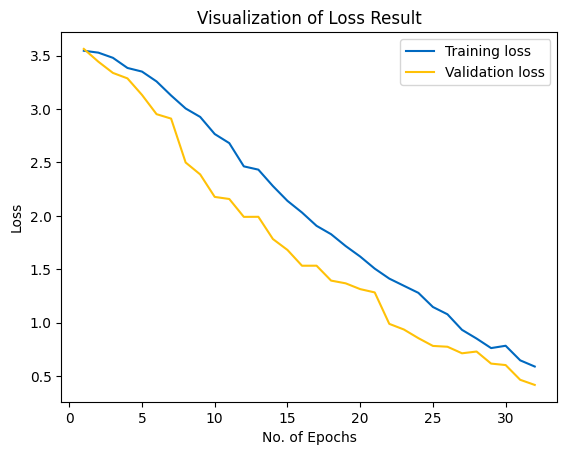

In [27]:
epochs = [i for i in range(1,len(training_history.history['accuracy'])+1)]
plt.plot(epochs,training_history.history['loss'],label="Training loss",color="#0069c0")
plt.plot(epochs,training_history.history['val_loss'],label="Validation loss",color="#ffc107")
plt.xlabel('No. of Epochs')
plt.ylabel('Loss')
plt.title('Visualization of Loss Result')
plt.legend()
plt.show()

# Training & Validation Accuracy Visualization

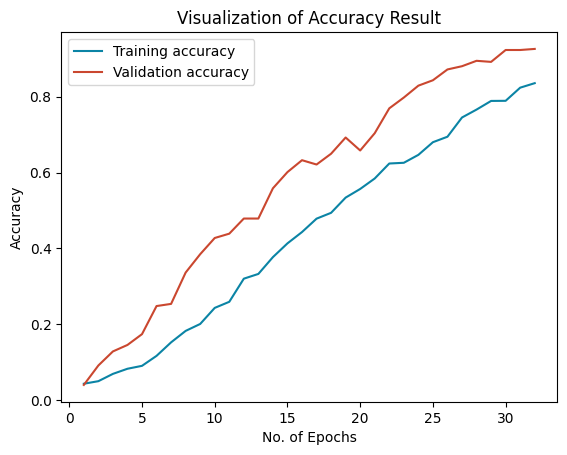

In [28]:
epochs = [i for i in range(1,len(training_history.history['accuracy'])+1)]
plt.plot(epochs,training_history.history['accuracy'],label="Training accuracy",color="#0b84a5")
plt.plot(epochs,training_history.history['val_accuracy'],label="Validation accuracy",color="#ca472f")
plt.xlabel('No. of Epochs')
plt.ylabel('Accuracy')
plt.title('Visualization of Accuracy Result')
plt.legend()
plt.show()

# Test set Evaluation

In [29]:
test_set = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/Mini Project/test',
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(64, 64),
    shuffle=False,
    seed=None,
    validation_split=None,
    subset=None,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False
)

Found 359 files belonging to 36 classes.


In [30]:
test_labels = test_set.class_names
test_labels

['apple',
 'banana',
 'beetroot',
 'bell pepper',
 'cabbage',
 'capsicum',
 'carrot',
 'cauliflower',
 'chilli pepper',
 'corn',
 'cucumber',
 'eggplant',
 'garlic',
 'ginger',
 'grapes',
 'jalepeno',
 'kiwi',
 'lemon',
 'lettuce',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'peas',
 'pineapple',
 'pomegranate',
 'potato',
 'raddish',
 'soy beans',
 'spinach',
 'sweetcorn',
 'sweetpotato',
 'tomato',
 'turnip',
 'watermelon']

In [31]:
file = open('/content/drive/MyDrive/Mini Project/labels.txt','w')
for i in test_labels:
  file.write(i+'\n')
file.close()

In [32]:
with open('/content/drive/MyDrive/Mini Project/labels.txt') as f:
  content = f.readlines()
content

['apple\n',
 'banana\n',
 'beetroot\n',
 'bell pepper\n',
 'cabbage\n',
 'capsicum\n',
 'carrot\n',
 'cauliflower\n',
 'chilli pepper\n',
 'corn\n',
 'cucumber\n',
 'eggplant\n',
 'garlic\n',
 'ginger\n',
 'grapes\n',
 'jalepeno\n',
 'kiwi\n',
 'lemon\n',
 'lettuce\n',
 'mango\n',
 'onion\n',
 'orange\n',
 'paprika\n',
 'pear\n',
 'peas\n',
 'pineapple\n',
 'pomegranate\n',
 'potato\n',
 'raddish\n',
 'soy beans\n',
 'spinach\n',
 'sweetcorn\n',
 'sweetpotato\n',
 'tomato\n',
 'turnip\n',
 'watermelon\n']

In [33]:
test_file_paths = test_set.file_paths
test_file_paths

['/content/drive/MyDrive/Mini Project/test/apple/Image_1.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_10.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_2.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_3.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_4.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_5.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_6.JPG',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_7.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_8.jpg',
 '/content/drive/MyDrive/Mini Project/test/apple/Image_9.jpg',
 '/content/drive/MyDrive/Mini Project/test/banana/Image_1.jpg',
 '/content/drive/MyDrive/Mini Project/test/banana/Image_10.jpg',
 '/content/drive/MyDrive/Mini Project/test/banana/Image_2.jpg',
 '/content/drive/MyDrive/Mini Project/test/banana/Image_3.jpg',
 '/content/drive/MyDrive/Mini Project/test/banana/Image_4.jpg',
 '/content/drive/MyDrive/Mini Project/test/banan

In [34]:
test_loss,test_acc = cnn.evaluate(test_set)
print('Test accuracy:', test_acc)

12/12 [==============================] - 35s 3s/step - loss: 0.4079 - accuracy: 0.9276
Test accuracy: 0.9275766015052795


In [35]:
test_set

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 36), dtype=tf.float32, name=None))>

## Calculating Accuracy of Model Achieved on Testing set

In [36]:
print(f"Testing set Accuracy: {test_acc*100:.2f} %")

Testing set Accuracy: 92.76 %


In [37]:
pred = cnn.predict(test_set)

12/12 [==============================] - 10s 795ms/step


In [38]:
pred.shape

(359, 36)

## Creating a Confusion Matrix for the Testing Data

In [39]:
# Extracting all fruit and vegetable names from their file paths
test_data = list()
for i in test_file_paths:
  test_data.append(i.split('/')[-2])

test_data

['apple',
 'apple',
 'apple',
 'apple',
 'apple',
 'apple',
 'apple',
 'apple',
 'apple',
 'apple',
 'banana',
 'banana',
 'banana',
 'banana',
 'banana',
 'banana',
 'banana',
 'banana',
 'banana',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauli

In [40]:
# Loading the labels.txt
with open('/content/drive/MyDrive/Mini Project/labels.txt') as f:
    content = f.readlines()

labels = list()
for i in content:
  labels.append(i[:-1])
labels

['apple',
 'banana',
 'beetroot',
 'bell pepper',
 'cabbage',
 'capsicum',
 'carrot',
 'cauliflower',
 'chilli pepper',
 'corn',
 'cucumber',
 'eggplant',
 'garlic',
 'ginger',
 'grapes',
 'jalepeno',
 'kiwi',
 'lemon',
 'lettuce',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'peas',
 'pineapple',
 'pomegranate',
 'potato',
 'raddish',
 'soy beans',
 'spinach',
 'sweetcorn',
 'sweetpotato',
 'tomato',
 'turnip',
 'watermelon']

In [41]:
# Creating the Predictions labels
pred_data = list()
for i in pred:
  result = labels[np.argmax(i)]
  pred_data.append(result)

pred_data

['apple',
 'apple',
 'apple',
 'apple',
 'potato',
 'potato',
 'apple',
 'apple',
 'apple',
 'apple',
 'banana',
 'banana',
 'garlic',
 'banana',
 'banana',
 'banana',
 'banana',
 'banana',
 'banana',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'beetroot',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'bell pepper',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'cabbage',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'capsicum',
 'bell pepper',
 'bell pepper',
 'capsicum',
 'capsicum',
 'capsicum',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'ginger',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'carrot',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',
 'cauliflower',

In [42]:
from sklearn.metrics import confusion_matrix

# Creating a confusion matrix
cm = confusion_matrix(test_data, pred_data)

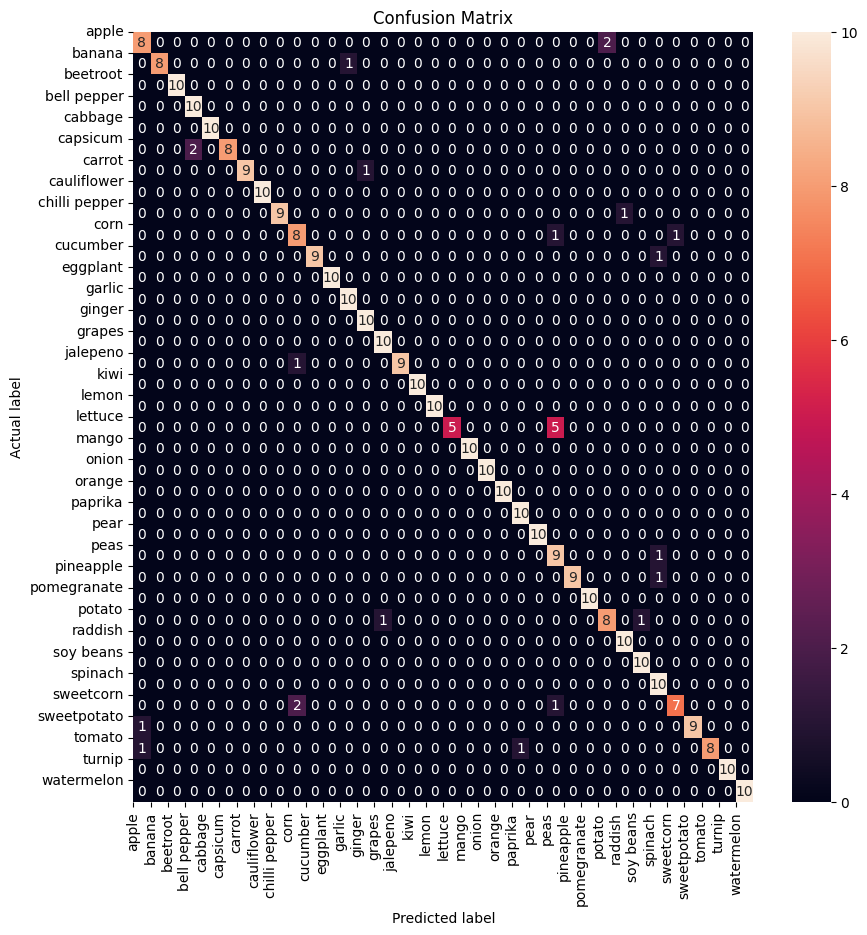

In [80]:
import seaborn as sns

plt.figure(figsize=(10,10))
# Visualizing the confusion
sns.heatmap(data=cm, annot=True)
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("Actual label")
plt.xticks(range(0,len(labels)),labels,rotation="vertical")
plt.yticks(range(0,len(labels)),labels,rotation="horizontal")
plt.show()

## Creating a Classification report on the Testing data

In [44]:
from sklearn.metrics import classification_report

print(classification_report(test_data, pred_data))

               precision    recall  f1-score   support

        apple       0.80      0.80      0.80        10
       banana       1.00      0.89      0.94         9
     beetroot       1.00      1.00      1.00        10
  bell pepper       0.83      1.00      0.91        10
      cabbage       1.00      1.00      1.00        10
     capsicum       1.00      0.80      0.89        10
       carrot       1.00      0.90      0.95        10
  cauliflower       1.00      1.00      1.00        10
chilli pepper       1.00      0.90      0.95        10
         corn       0.73      0.80      0.76        10
     cucumber       1.00      0.90      0.95        10
     eggplant       1.00      1.00      1.00        10
       garlic       0.91      1.00      0.95        10
       ginger       0.91      1.00      0.95        10
       grapes       0.91      1.00      0.95        10
     jalepeno       1.00      0.90      0.95        10
         kiwi       1.00      1.00      1.00        10
        l

## Visualizing the Predictions on Testing set

In [47]:
import cv2

def show_25_images():
  """
  Displays a plot of 25 images with their true labels and predicted labels from a data batch.
  """
  count = 0
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Create an image
    img = cv2.imread(test_file_paths[i+count])
    # Converting BGR to RGB
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    # Add the true and predicted label as the title
    true_label = test_file_paths[i+count].split('/')[-2]
    if true_label == test_labels[np.argmax(pred[i+count])]:
      set_color = "green"
    else:
      set_color = "red"
    plt.title(f"True label: {true_label} \n Predicted label: {test_labels[np.argmax(pred[i+count])]}",fontsize=10,color=set_color)
    # Add the padding so that the title and image appears properly
    plt.tight_layout(pad=0.3)
    # Turn the grid lines off
    plt.axis("off")

    count += np.random.randint(7,10)

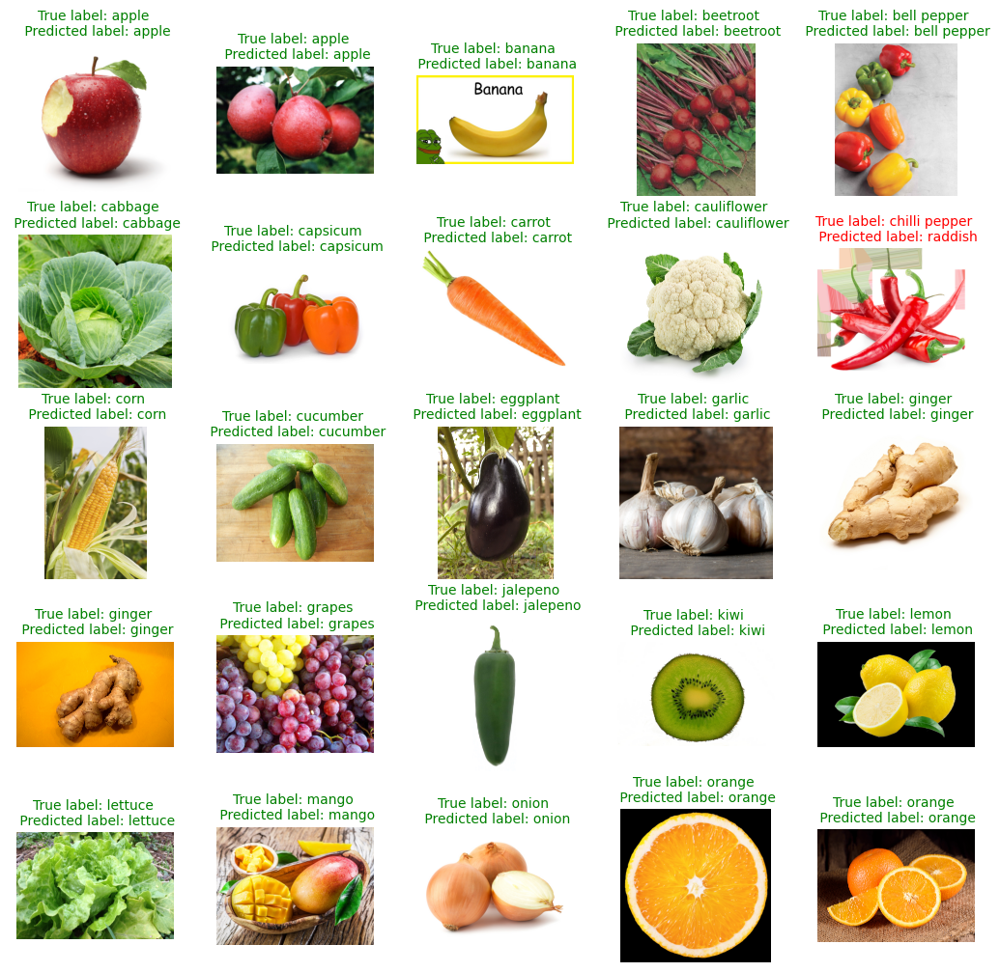

In [48]:
show_25_images()

# Making Predictions on Custom Images

## Loading Model

In [49]:
cnn_loaded = tf.keras.models.load_model('/content/drive/MyDrive/Mini Project/trained_model_3.h5')

## Preprocessing the Image

In [74]:
image_path = '/content/drive/MyDrive/Mini Project/custom images/image_12.jpg'

def image_preprocessing(image_path):
  image = tf.keras.preprocessing.image.load_img(image_path,target_size=(64,64))
  input_arr = tf.keras.preprocessing.image.img_to_array(image)
  # Convert single image to a batch
  input_arr = np.array([input_arr])
  return input_arr

input_arr = image_preprocessing(image_path)
input_arr

array([[[[250., 251., 253.],
         [250., 251., 253.],
         [250., 251., 253.],
         ...,
         [250., 251., 253.],
         [250., 251., 253.],
         [250., 251., 253.]],

        [[250., 251., 253.],
         [250., 251., 253.],
         [249., 250., 252.],
         ...,
         [250., 251., 253.],
         [250., 251., 253.],
         [251., 252., 254.]],

        [[250., 251., 253.],
         [250., 251., 253.],
         [249., 250., 252.],
         ...,
         [249., 250., 252.],
         [250., 251., 253.],
         [250., 251., 253.]],

        ...,

        [[248., 248., 248.],
         [247., 247., 245.],
         [246., 245., 243.],
         ...,
         [244., 244., 246.],
         [246., 246., 248.],
         [248., 248., 248.]],

        [[249., 249., 249.],
         [248., 248., 248.],
         [245., 245., 243.],
         ...,
         [245., 245., 247.],
         [247., 247., 249.],
         [248., 248., 248.]],

        [[249., 249., 249.],
       

## Making Predictions

In [75]:
def predict_image(input_arr):
  predictions = cnn_loaded.predict(input_arr)
  # Retrieve index of max element
  result_index = np.argmax(predictions)
  # Return the label corresponding to the the index
  result = labels[result_index]
  return f"Model prediction: {result}"

result = predict_image(input_arr)
result

1/1 [==============================] - 0s 27ms/step


'Model prediction: lemon'

## Visualizing the Predictions

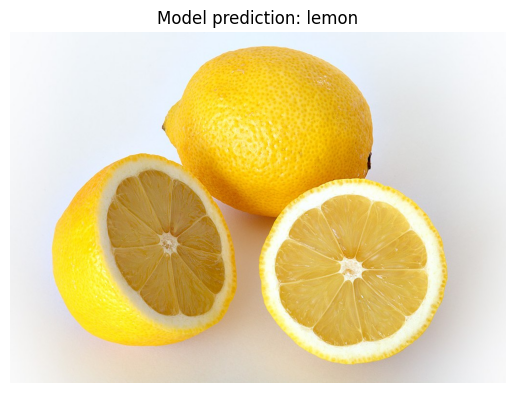

In [76]:
def display_predicted_image(image_path,result):
    # Create an image
    img = cv2.imread(image_path)
    # Converting BGR to RGB
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title(f"{result}")
    plt.axis("off")

display_predicted_image(image_path,result)